# Positional Embeddings
[link](https://ut.philkr.net/deeplearning/transformers/positional_embeddings/)

Since Attention is permutation equivariant, which is equivalent to say that is a set operation, Attention is not able to give meaning to the individual variables. Attention only looks at them as a set of values.
In many domains like lenguage proccessing, set operations are not suitable, the order matters. 

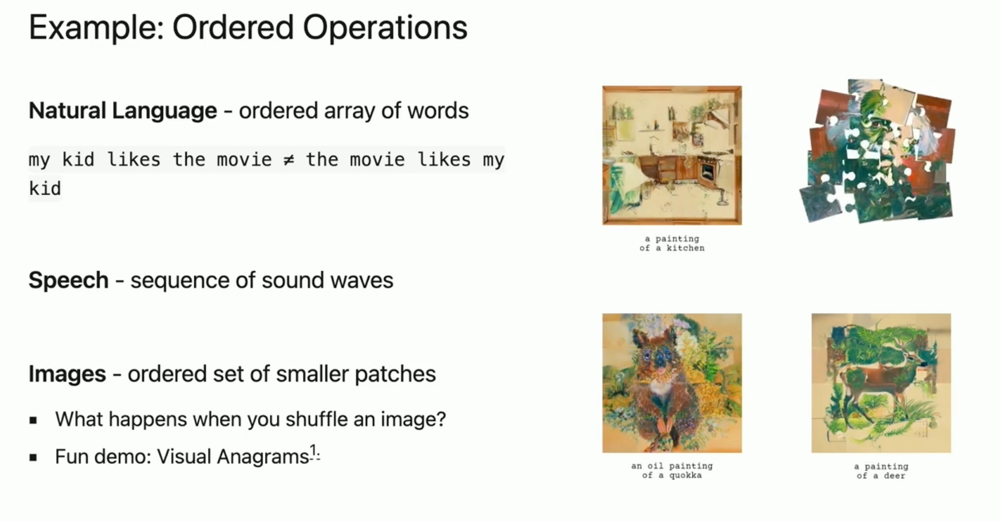

to solve this we add positional embedding

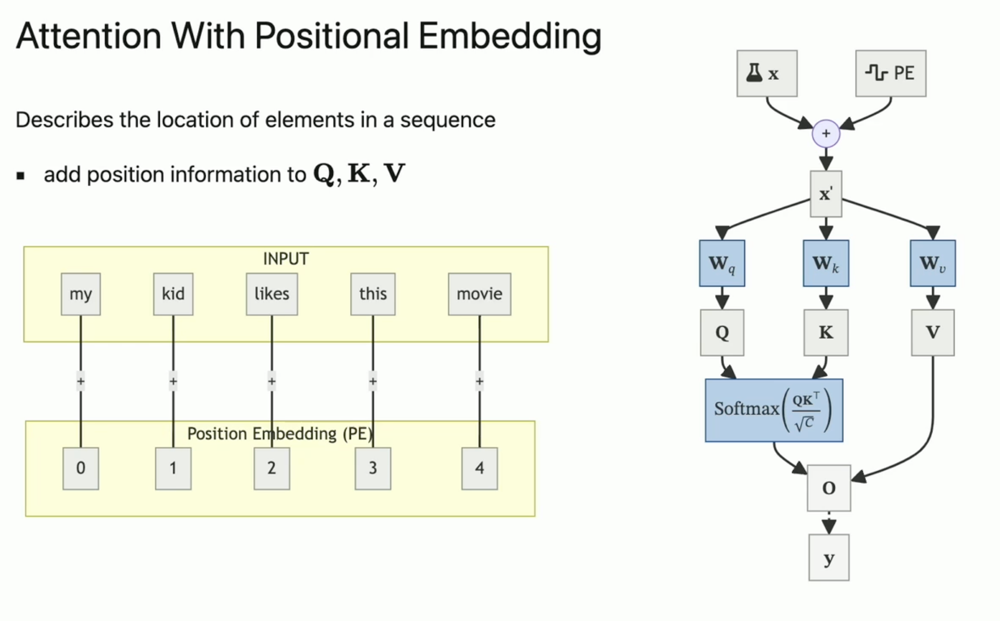

## SelfAttention with Positional Embedding

Inputs
* $X \in \mathbb{R}^{N \times c}$ 

Weights
* a set of querry weights $W_q \in \mathbb{R}^{c\times d_k}$ and bias $b_q\in \mathbb{R}^{d_k}$
* a set of key weights $W_k \in \mathbb{R}^{c \times d_k}$ and bias $b_k\in \mathbb{R}^{d_k}$
* a set of value weights $W_v \in \mathbb{R}^{c \times d_v}$ and bias $b_q\in \mathbb{R}^{d_v}$

Output: 
* Output $O= [o_1|o_2|\dots|o_N]^T \in\mathbb{R}^{N\times d_v}$
\begin{align*}
O =\text{SelfAttentionPE}_{\mathcal{W},E}(X)=\text{SelfAttention}_{\mathcal{W}}(X+E),
\end{align*}
where
\begin{align*}
\mathcal{W} &= \{W_q,b_q,W_k,b_k,W_v,b_v\},\\
E &\in \mathbb{R}^{N \times c}.
\end{align*}

So, $\text{SelfAttentionPE}$ is not longer permutation equivariant. An efficient Positional embeding is

## Sinusoidal Positional Embedding

$$
\begin{align*}
E_{n,2i-1} &= \cos\left(\frac{n}{10 000^{\frac{2i}{c}}}\right),\quad i = 1,2,\dots,\lfloor (c+1)/2 \rfloor \\
E_{n,2i} &= \sin\left(\frac{n}{10 000^{\frac{2i}{c}}}\right),\quad i = 1,2,\dots,\lfloor c/2 \rfloor \\

\end{align*}
$$

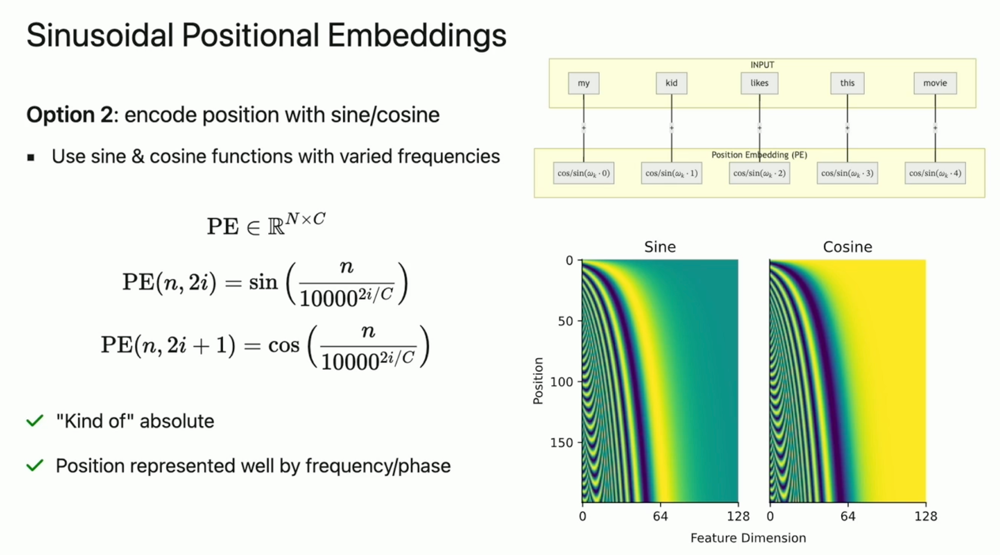
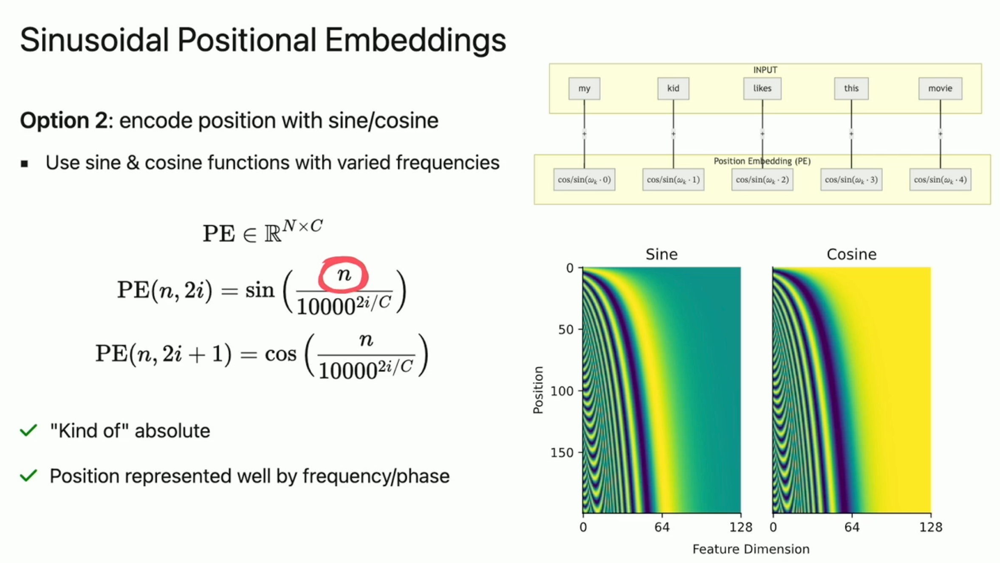

## SelfAttention with Learnable Positional Embedding

This works well if there is a maximum sequence length reached during training (there is always training sequences that are longer or equally long thant test data). This is mostly used when the input length $N$ is fixed.

Inputs
* $X \in \mathbb{R}^{N \times c}$ 

Weights
* a set of querry weights $W_q \in \mathbb{R}^{c\times d_k}$ and bias $b_q\in \mathbb{R}^{d_k}$.
* a set of key weights $W_k \in \mathbb{R}^{c \times d_k}$ and bias $b_k\in \mathbb{R}^{d_k}$.
* a set of value weights $W_v \in \mathbb{R}^{c \times d_v}$ and bias $b_q\in \mathbb{R}^{d_v}$.
* learnable positional embedding $E \in \mathbb{R}^{N \times c}$.
Output: 

Output
* Output $O= [o_1|o_2|\dots|o_N]^T \in\mathbb{R}^{N\times d_v}$
\begin{align*}
O =\text{SelfAttentionPE}_{\mathcal{W},E}(X)=\text{SelfAttention}_{\mathcal{W}}(X+E),
\end{align*}
where
\begin{align*}
\mathcal{W} &= \{W_q,b_q,W_k,b_k,W_v,b_v\}.
\end{align*}

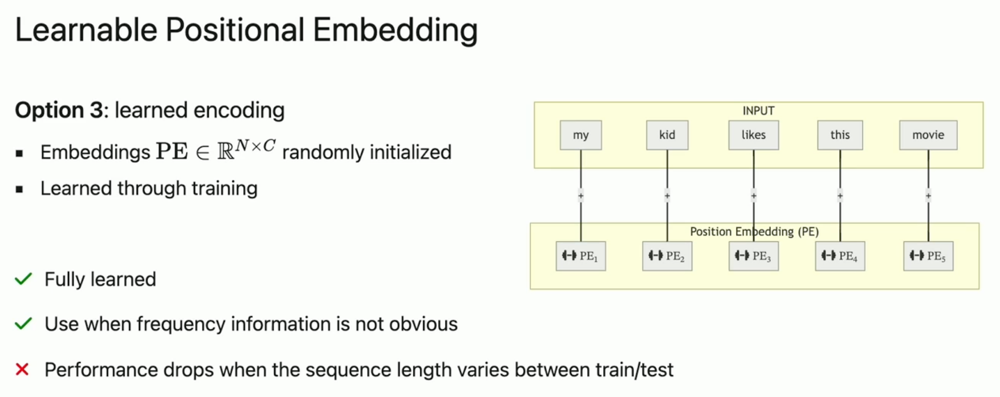

Example of learnable positional embedding

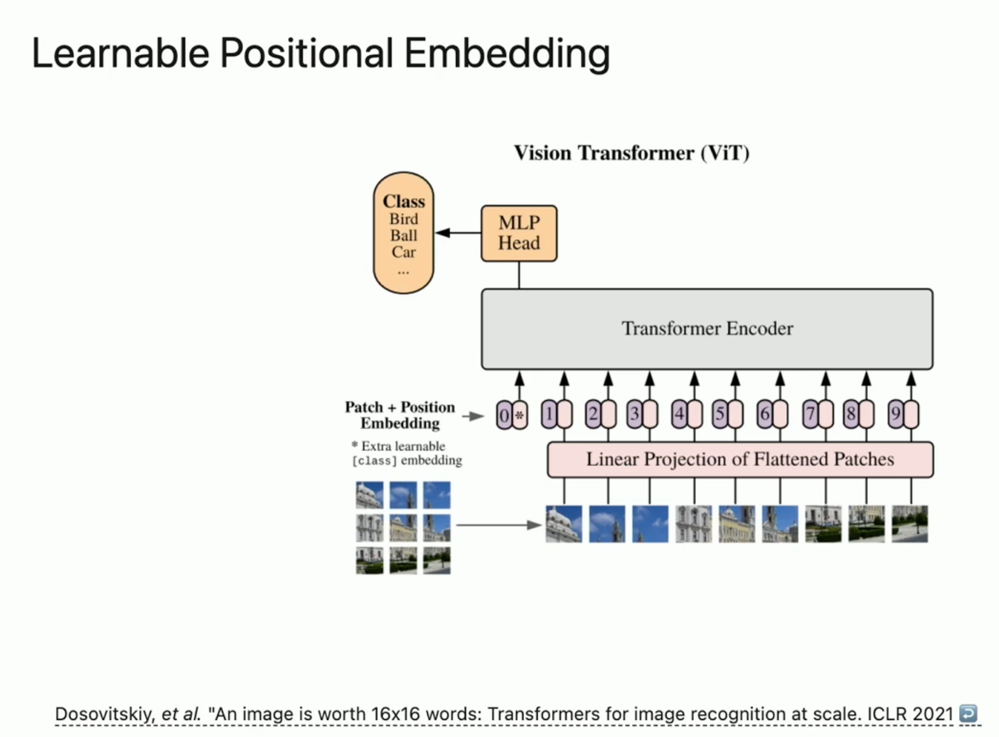

## SelfAttention with relative Positional Embedding

The embedding is added to the scores matrix instead of the inputs and only learns relative positions. In this case biases are not used. This makes the learnning more efficient.


Inputs
* $X \in \mathbb{R}^{N \times c}$ 

Weights
* a set of querry weights $W_q \in \mathbb{R}^{c\times d_k}$
* a set of key weights $W_k \in \mathbb{R}^{c \times d_k}$
* a set of value weights $W_v \in \mathbb{R}^{c \times d_v}$
* a set of relative positional embeddings $B\in \mathbb{R}^{N \times N}$

Output: $O= [o_1|o_2|\dots|o_M]^T \in\mathbb{R}^{M \times d_v}$
$$ O  =\text{SelfAttentionRelPE}_B(X) =  \text{softmax}\left(\frac{XW_q(XW_k)^T+B}{\sqrt{d_k}}\right)XW_v$$

where $\text{softmax}$ is applied per row.

**Case 1:** T5-bias

  $$B = \begin{pmatrix}
    b_0 & b_{-1} & b_{-2} & \dots & b_{-N+1}\\
    b_1 & b_0 & b_{-1} & \dots & b_{-N+2}\\
    b_2 & b_1 & b_0 & \dots & b_{-N+3}\\
    \vdots & \vdots & \vdots & \ddots &\vdots\\
    b_{N-1} & b_{N-2} & b_{N-3} & \dots & b_{0}\\
    \end{pmatrix}
  $$



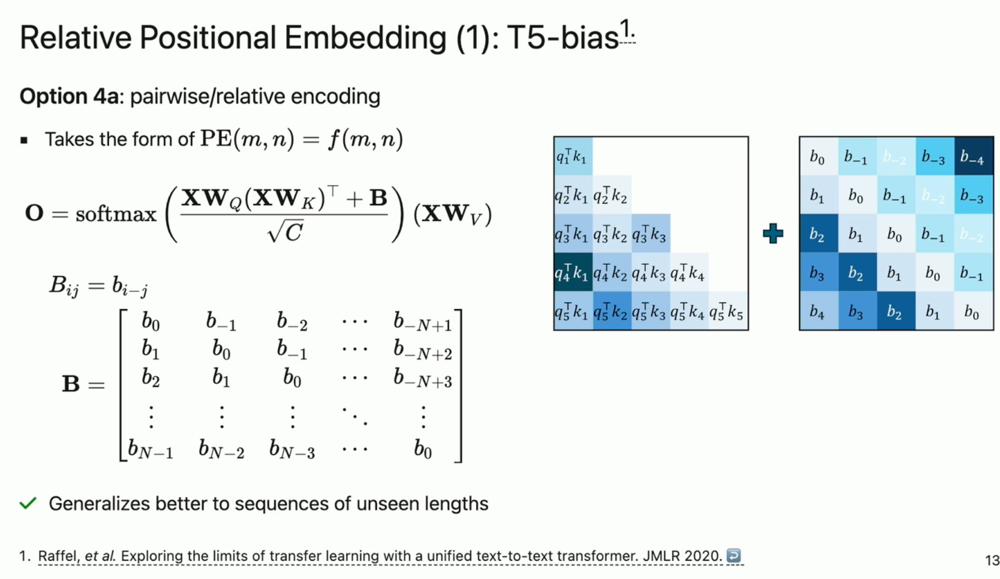

**Case 2:** Alibi

Generalizes beter for sequence of unseen lengths
  $$B = \alpha \begin{pmatrix}
    0 & 0 & 0 & \dots & 0\\
    -1 & 0 & 0 & \dots & b_{-N+2}\\
    -2 & -1 & 0& \dots & b_{-N+3}\\
    \vdots & \vdots & \vdots & \ddots &\vdots\\
    -N+1 & -N+2 & -N+3 & \dots & 0\\
    \end{pmatrix}
  $$

## Rotary Positional Embedding: 

Inputs
* $X = [x_1|x_2|\dots|x_N]^T \in \mathbb{R}^{N \times c}$ 

Weights
* a set of querry weights $W_q \in \mathbb{R}^{c\times d_k}$
* a set of key weights $W_k \in \mathbb{R}^{c \times d_k}$
* a set of value weights $W_v \in \mathbb{R}^{c \times d_v}$

Output: $O= [o_1|o_2|\dots|o_M]^T \in\mathbb{R}^{M \times d_v}$
$$ O  =\text{SelfAttentionRelPE}_B(X) =  \text{softmax}\left(\frac{S}{\sqrt{d_k}}\right)XW_v$$

where $\text{softmax}$ is applied per row ans $the score matrix is defined as

$$
\begin{align*}
S_{m,n}&=q_m^Tk_n, \quad n,m=1,2,\dots,N.\\ 
q_n &= R_{\Theta_{d_k},n}W_q^{T}x_n, \quad n =1,2,\dots,N.\\ 
k_n &= R_{\Theta_{d_k},n}W_k^{T}x_n, \quad n =1,2,\dots,N.\\ 
R_{\Theta_{d},n} &=
\begin{pmatrix}
\cos(n\theta_1) & -\sin(n\theta_1) & 0 & 0 & \cdots & 0 & 0 \\
\sin(n\theta_1) & \cos(n\theta_1)  & 0 & 0 & \cdots & 0 & 0 \\
0 & 0 & \cos(n\theta_2) & -\sin(n\theta_2) & \cdots & 0 & 0 \\
0 & 0 & \sin(n\theta_2) & \cos(n\theta_2)  & \cdots & 0 & 0 \\
\vdots & \vdots & \vdots & \vdots & \ddots & \vdots & \vdots \\
0 & 0 & 0 & 0 & \cdots & \cos(n\theta_{d/2}) & -\sin(n\theta_{d/2}) \\
0 & 0 & 0 & 0 & \cdots & \sin(n\theta_{d/2}) & \cos(n\theta_{d/2})
\end{pmatrix},\\
\Theta_d & = \left\{\theta_i = 10000^{\frac{-2(i-1)}{d}}\right\}_{i=1}^{d/2}
\end{align*}
$$



Notice that 
$$
\begin{align*}
\begin{pmatrix}
\cos(\alpha) & -\sin(\alpha) \\
\sin(\alpha) & \cos(\alpha) \\
\end{pmatrix}^T
&\begin{pmatrix}
\cos(\beta) & -\sin(\beta) \\
\sin(\beta) & \cos(\beta) \\
\end{pmatrix} =\begin{pmatrix}
\cos(\alpha) & \sin(\alpha) \\
-\sin(\alpha) & \cos(\alpha) \\
\end{pmatrix}
\begin{pmatrix}
\cos(\beta) & -\sin(\beta) \\
\sin(\beta) & \cos(\beta) \\
\end{pmatrix},\\
&=\begin{pmatrix}
\cos(\alpha)\cos(\beta)+\sin(\alpha)\sin(\beta) & -\cos(\alpha)\sin(\beta)+\sin(\alpha)\cos(\beta) \\
-\sin(\alpha)\cos(\beta)+\cos(\alpha)\sin(\beta) & \sin(\alpha)\sin(\beta)+\cos(\alpha)\cos(\beta) \\
\end{pmatrix},\\
&=\begin{pmatrix}
\cos(\alpha)\cos(\beta)+\sin(\alpha)\sin(\beta) & \cos(\alpha)\sin(-\beta)+\sin(\alpha)\cos(-\beta) \\
\sin(\alpha)\cos(-\beta)+\cos(\alpha)\sin(-\beta) & \cos(\alpha)\cos(\beta)+\sin(\alpha)\sin(\beta) \\
\end{pmatrix},\\
&=\begin{pmatrix}
\cos(\alpha-\beta) & -\sin(\alpha-\beta) \\
\sin(\alpha-\beta) & \cos(\alpha-\beta) \\
\end{pmatrix}.
\end{align*}
$$
So, we obtain $R_{\Theta_{d_k},m}^{T} R_{\Theta_{d_k},n}=R_{\Theta_{d_k},m-n}$, and from here we get
$$
\begin{align*}
S_{m,n}&=q_m^Tk_n,\\
        &=(R_{\Theta_{d_k},m}W_q^{T}x_m)^T R_{\Theta_{d_k},n}W_q^{T}x_n,\\
        &=x_m^TW_qR_{\Theta_{d_k},m}^{T} R_{\Theta_{d_k},n}W_q^{T}x_n,\\
        &=x_m^TW_qR_{\Theta_{d_k},m}^{T} R_{\Theta_{d_k},n}W_q^{T}x_n,\\
        &=x_m^TW_qR_{\Theta_{d_k},m-n}W_q^{T}x_n.
\end{align*}
$$

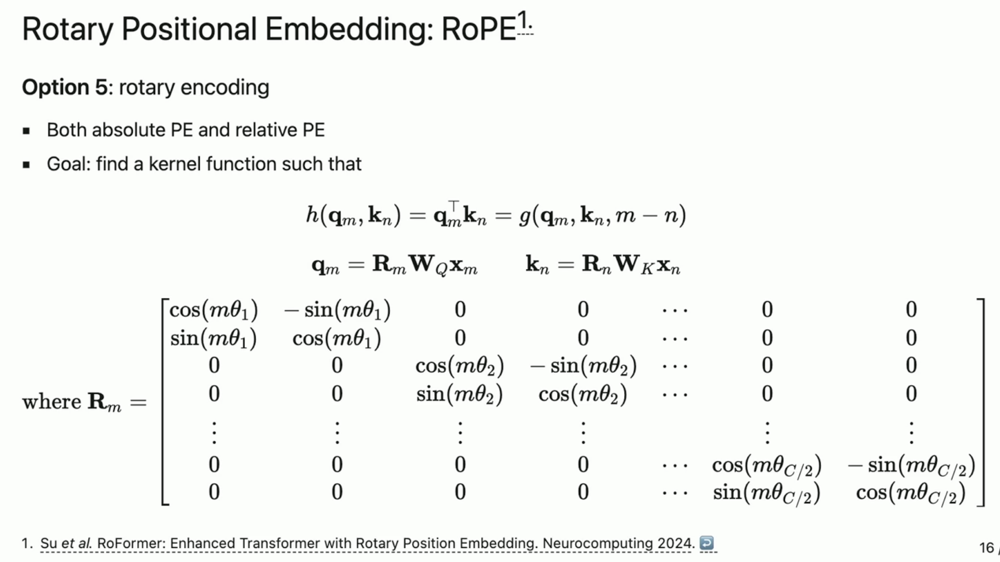

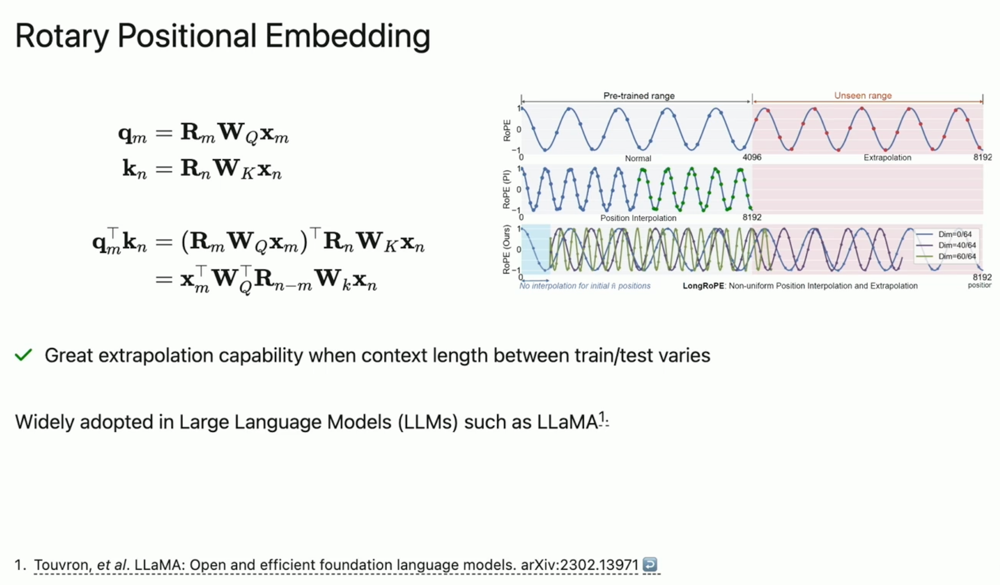

## Other applications out of Attention

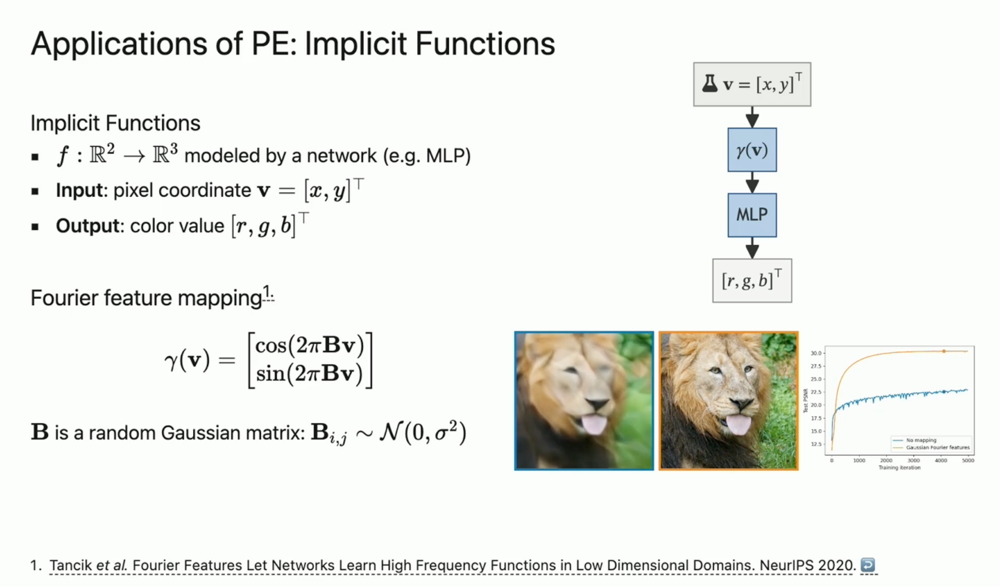

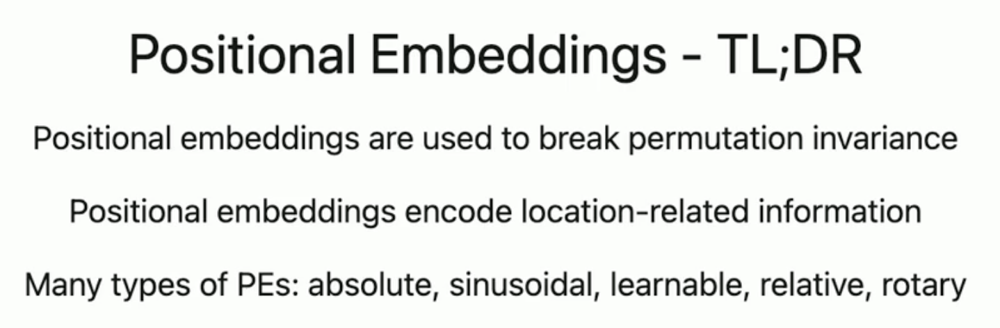